In [7]:
from DataManipulation.DataHandler import DEMAsDiffnDeri2Multinomial, mergeMonths
import pandas as pd
from torch.utils.data import ConcatDataset
#data = mergePeriod(1,4,beg="DAT_ASCII_EURUSD_M1_2021",dir="./eurusd2021/",dump=False)
data2021 = mergeMonths(start=1, end=9,beg="DAT_ASCII_EURUSD_M1_2021",dir = './Data/eurusd2021/', dump=True)

dir = "./Data/"
beg = "DAT_ASCII_EURUSD_M1_"
year = 2020
data2020 = pd.read_csv(dir+beg+str(year)+'.csv',sep=';',names = ['Open','High','Low','Close','Volume']) 
year = 2019
data2019 = pd.read_csv(dir+beg+str(year)+'.csv',sep=';',names = ['Open','High','Low','Close','Volume']) 

data = pd.concat([data2019,data2020,data2021])
data.index.name = "Date"
data.index = pd.to_datetime(data.index)

from time import time
t = time()
dc = data.copy()
emaperiods = [20,50,100,200,300,60*24*50,60*24*200]
dataset = DEMAsDiffnDeri2Multinomial(dc)#,emaperiods = emaperiods)

print([x.__name__ for x in dataset.indicators])
validEntries = dataset.raw.dropna()
predictorNames = dataset.periodDiffNames #[x.__name__+"D1" for x in dataset.indicators]+[x.__name__+"D2" for x in dataset.indicators]
ResponseName = "_y_enter_exit"

/mnt/c/Users/Luoxi/Documents/TimeSeriesRegress/DataManipulation/DataHandler.py:308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.raw['IndicatorSupportNeuPIP'][self.raw['IndicatorSupportNeuPIP']==0] = 0.4


['dema9', 'ema20', 'ema50', 'ema100', 'ema200', 'ema300']


In [1]:
from DataManipulation.DataHandler import DEMAsDiffnDeri2Multinomial, mergeMonths
import pandas as pd
from torch.utils.data import ConcatDataset
#data = mergePeriod(1,4,beg="DAT_ASCII_EURUSD_M1_2021",dir="./eurusd2021/",dump=False)
data2021 = mergeMonths(start=1, end=9,beg="DAT_ASCII_EURUSD_M1_2021",dir = './Data/eurusd2021/', dump=True)

dir = "./Data/"
beg = "DAT_ASCII_EURUSD_M1_"
year = 2020
data2020 = pd.read_csv(dir+beg+str(year)+'.csv',sep=';',names = ['Open','High','Low','Close','Volume']) 
year = 2019
data2019 = pd.read_csv(dir+beg+str(year)+'.csv',sep=';',names = ['Open','High','Low','Close','Volume']) 

data = pd.concat([data2019,data2020,data2021])
data.index.name = "Date"
data.index = pd.to_datetime(data.index)

from time import time
t = time()
dc = data.copy()
emaperiods = [20,50,100,200,300,60*24*50,60*24*200]
dataset = DEMAsDiffnDeri2Multinomial(dc,emaperiods = emaperiods)

print([x.__name__ for x in dataset.indicators])
validEntries = dataset.raw.dropna()
predictorNames = dataset.periodDiffNames #[x.__name__+"D1" for x in dataset.indicators]+[x.__name__+"D2" for x in dataset.indicators]
ResponseName = "_y_enter_exit"

/mnt/c/Users/Luoxi/Documents/TimeSeriesRegress/DataManipulation/DataHandler.py:330: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.raw['IndicatorSupportNeuPIP'][self.raw['IndicatorSupportNeuPIP']==0] = 0.4


['dema9', 'ema20', 'ema50', 'ema100', 'ema200', 'ema300', 'ema72000', 'ema288000']


1021384


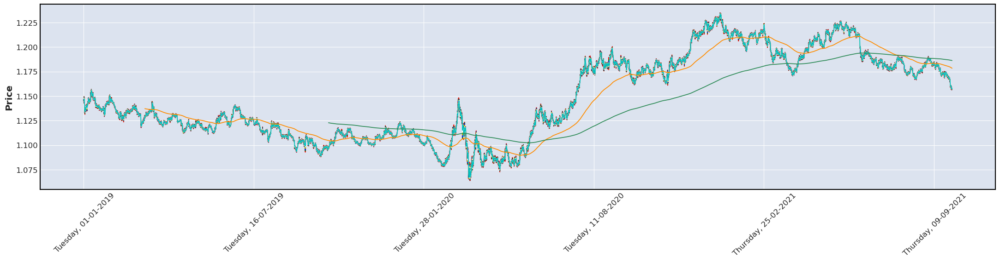

In [6]:
import mplfinance as mpf

df = dataset.raw.iloc[0:]
print(len(df))
apds = [
        mpf.make_addplot(df['dema9'],panel=0,color='r'),
        mpf.make_addplot(df['ema20'],panel=0,color='g'),
        mpf.make_addplot(df['ema50'],panel=0,color='b'),
        mpf.make_addplot(df['ema100'],panel=0,color='y'),
        mpf.make_addplot(df['ema200'],panel=0,color='w'),
        mpf.make_addplot(df['ema300'],panel=0,color='c'),

        mpf.make_addplot(df['ema72000'],panel=0,color='darkorange'),
        mpf.make_addplot(df['ema288000'],panel=0,color='seagreen'),

    ]

# fig, axes = mpf.plot(df,addplot=apds,figscale=14,volume=False, returnfig=True)
fig, axes = mpf.plot(df,type = 'line', figratio=(250,50),datetime_format=' %A, %d-%m-%Y',volume=False, returnfig=True,addplot=apds)#addplot=apds,figratio=(10,5),volume=False, returnfig=True)

50000


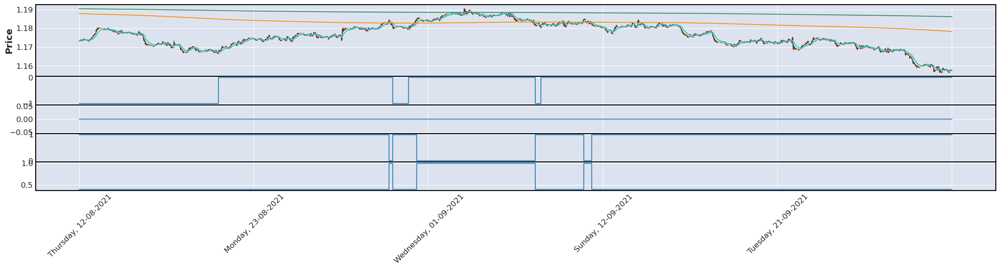

In [21]:
import mplfinance as mpf

df = dataset.raw.iloc[-50000:]
print(len(df))
apds = [
        mpf.make_addplot(df['dema9'],panel=0,color='r'),
        mpf.make_addplot(df['ema20'],panel=0,color='g'),
        mpf.make_addplot(df['ema50'],panel=0,color='b'),
        mpf.make_addplot(df['ema100'],panel=0,color='y'),
        mpf.make_addplot(df['ema200'],panel=0,color='w'),
        mpf.make_addplot(df['ema300'],panel=0,color='c'),

        mpf.make_addplot(df['ema72000'],panel=0,color='darkorange'),
        mpf.make_addplot(df['ema288000'],panel=0,color='seagreen'),
        
        mpf.make_addplot(df['_y_enter_exit'],panel=1),
        mpf.make_addplot(df['IndicatorSupportPosPIP'],panel=2),
        mpf.make_addplot(df['IndicatorSupportNegPIP'],panel=3),
        mpf.make_addplot(df['IndicatorSupportNeuPIP'],panel=),
    ]

# fig, axes = mpf.plot(df,addplot=apds,figscale=14,volume=False, returnfig=True)
fig, axes = mpf.plot(df,type = 'line', figratio=(250,50),datetime_format=' %A, %d-%m-%Y',volume=False, returnfig=True,addplot=apds)#addplot=apds,figratio=(10,5),volume=False, returnfig=True)

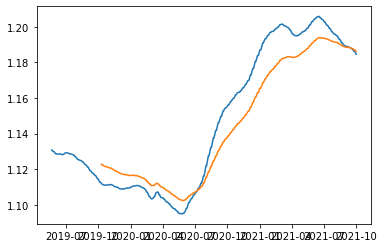

In [14]:
import numpy as np
import pandas as pd
def BASEema(series,period):
    base = np.empty(len(series))
    base[:] = np.nan
    print("base",len(base))
    myema = pd.Series(base,index =  series.index)
    print("ema",len(myema))

    smoothing = 2
    
    start_idx = period
    myema[start_idx] = np.mean(series[0:period])
    for i in range(period+1,len(series)):
        #print(myema[i-1]*(1+period-smoothing))
        myema[i] = myema[i-1]*(1+period-smoothing)/(1+period)+series[i]*(smoothing)/(1+period)
    return myema

import numba
@numba.jit(nopython = True)
def NUMBAema(series,period):
    myema = np.empty(len(series),dtype="float64")
    myema[:] = np.nan
    smoothing = 2
    start_idx = period

    myema[start_idx] = np.mean(series[0:period])
    for i in range(period+1,len(series)):
        #print(myema[i-1]*(1+period-smoothing))
        myema[i] = myema[i-1]*(1+period-smoothing)/(1+period)+series[i]*(smoothing)/(1+period)
    return myema
def MYema(series,period):
    if isinstance(series,pd.Series):
        raw = series.to_numpy()
    else:
        raw = series
    return pd.Series(NUMBAema(raw,period),index = series.index)
sample = dataset.raw['Close']

import matplotlib.pyplot as plt
from talib import DEMA,EMA
target = 60*24*100
plt.figure(0)
plt.plot(MYema(sample,target),label ="fast")#,type = 'line')

plt.figure(0)
target = 60*24*200
plt.plot(MYema(sample,target),label ="slow")#,type = 'line')


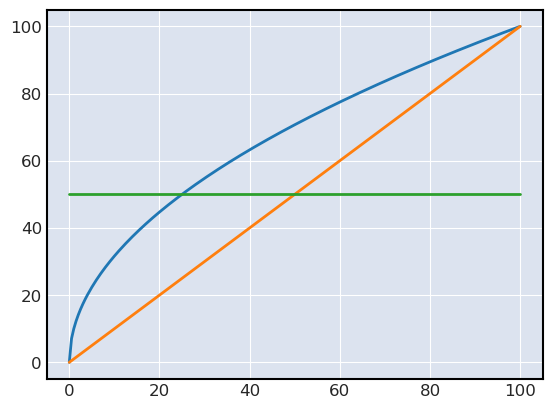

In [35]:
import numpy as np
x=np.linspace(0,100,num=201)
#help(np.linspace)
y = np.sqrt(x)*10
import matplotlib.pyplot as plt
plt.figure(3)
plt.plot(x,y)
plt.plot(x,x)
plt.plot(x,np.ones(len(x))*50)

In [1]:
from DataManipulation.DataHandler import  mergeMonths, DemaMinDayMultinom

import pandas as pd
from torch.utils.data import ConcatDataset
#data = mergePeriod(1,4,beg="DAT_ASCII_EURUSD_M1_2021",dir="./eurusd2021/",dump=False)
data2021 = mergeMonths(start=1, end=9,beg="DAT_ASCII_EURUSD_M1_2021",dir = './Data/eurusd2021/', dump=True)

dir = "./Data/"
beg = "DAT_ASCII_EURUSD_M1_"
year = 2020
data2020 = pd.read_csv(dir+beg+str(year)+'.csv',sep=';',names = ['Open','High','Low','Close','Volume']) 
year = 2019
data2019 = pd.read_csv(dir+beg+str(year)+'.csv',sep=';',names = ['Open','High','Low','Close','Volume']) 

data = pd.concat([data2019,data2020,data2021])
data.index.name = "Date"
data.index = pd.to_datetime(data.index)

dc = data.copy()
emaperiods = [60*2,60*3,60*5,60*7,60*24*100,60*24*200]
dataset = DemaMinDayMultinom(dc,emaperiods = emaperiods)
print([x.__name__ for x in dataset.indicators])
validEntries = dataset.raw.dropna()
predictorNames = dataset.periodDiffNames #[x.__name__+"D1" for x in dataset.indicators]+[x.__name__+"D2" for x in dataset.indicators]
ResponseName = "_y_enter_exit"

['dema9', 'ema120', 'ema180', 'ema300', 'ema420', 'ema144000', 'ema288000']


1021384
1021384


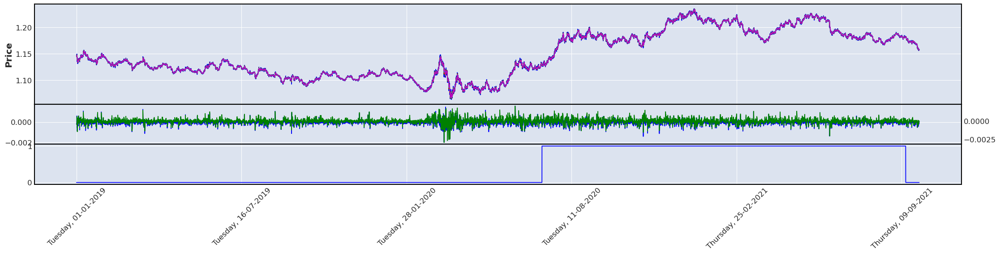

In [ ]:
import mplfinance as mpf

df = dataset.raw.iloc[-60*24*30*12*2:]
colors = ['b','g','r','c','m','y','k','w']
print(len(dataset.raw))
print(len(df))
apds = [
        mpf.make_addplot(df[dataset.indicators[i].__name__],panel=0,color=colors[i])
        for i in range(len(dataset.indicators)-2)
    ] + [
        mpf.make_addplot(df['ema120']-df['ema180'],panel=1,color='b'),
        mpf.make_addplot(df['ema180']-df['ema300'],panel=1,color='g'),
    ] + [
        mpf.make_addplot(df['ema144000']-df['ema288000']>0,panel=2,color='b'),
    ]

# fig, axes = mpf.plot(df,addplot=apds,figscale=14,volume=False, returnfig=True)
fig, axes = mpf.plot(df,type = 'line', figratio=(250,50),datetime_format=' %A, %d-%m-%Y',volume=False, returnfig=True,addplot=apds)#addplot=apds,figratio=(10,5),volume=False, returnfig=True)

1021384
43200


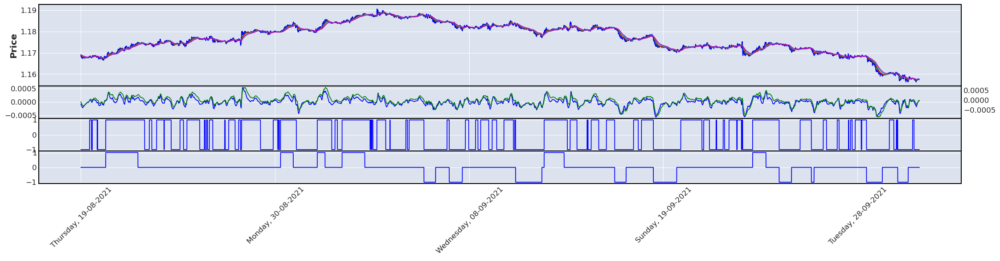

In [7]:
import mplfinance as mpf

df = dataset.raw.iloc[-60*24*30:]
colors = ['b','g','r','c','m','y','k','w']
print(len(dataset.raw))
print(len(df))
import numpy as np
apds = [
        mpf.make_addplot(df[dataset.indicators[i].__name__],panel=0,color=colors[i])
        for i in range(len(dataset.indicators)-2)
    ] + [
        mpf.make_addplot(df['ema120']-df['ema180'],panel=1,color='b'),
        mpf.make_addplot(df['ema180']-df['ema300'],panel=1,color='g'),
    ] + [
        mpf.make_addplot(np.sign(df['ema120']-df['ema420']),panel=2,color='b'),
    ] + [
        mpf.make_addplot(df['_y_enter_exit'],panel=3,color='b'),
        
    ]

# fig, axes = mpf.plot(df,addplot=apds,figscale=14,volume=False, returnfig=True)
fig, axes = mpf.plot(df,type = 'line', figratio=(250,50),datetime_format=' %A, %d-%m-%Y',volume=False, returnfig=True,addplot=apds)#addplot=apds,figratio=(10,5),volume=False, returnfig=True)

In [5]:
dataset.zonecount
len(dataset.raw)

1021384

In [ ]:
print(dataset.raw.columns)

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'dema9', 'dema9D1', 'dema9D2',
       'ema120', 'ema120D1', 'ema120D2', 'ema180', 'ema180D1', 'ema180D2',
       'ema300', 'ema300D1', 'ema300D2', 'ema420', 'ema420D1', 'ema420D2',
       'ema144000', 'ema144000D1', 'ema144000D2', 'ema288000', 'ema288000D1',
       'ema288000D2', 'Close_dema9', 'dema9_ema120', 'dema9D1_ema120D1',
       'dema9D2_ema120D2', 'ema120_ema180', 'ema120D1_ema180D1',
       'ema120D2_ema180D2', 'ema180_ema300', 'ema180D1_ema300D1',
       'ema180D2_ema300D2', 'ema300_ema420', 'ema300D1_ema420D1',
       'ema300D2_ema420D2', 'ema420_ema144000', 'ema420D1_ema144000D1',
       'ema420D2_ema144000D2', 'ema144000_ema288000',
       'ema144000D1_ema288000D1', 'ema144000D2_ema288000D2',
       'IndicatorSupportPosPIP', 'IndicatorSupportNegPIP',
       'IndicatorSupportNeuPIP'],
      dtype='object')


In [ ]:
dataset.indicators[-3].__name__
dataset.indicators[1].__name__

'ema120'